Brute-Force matching took 0.037978 seconds


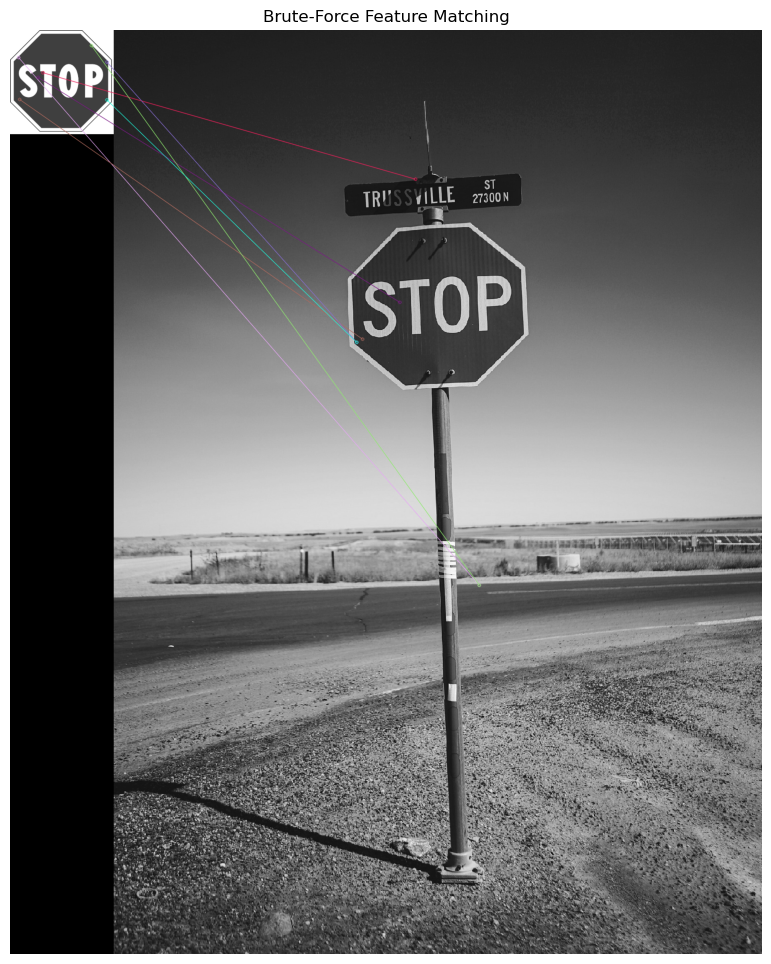

In [1]:
# Brute force matches

import cv2
import numpy as np
import time
import matplotlib.pyplot as plt  # Import Matplotlib for Jupyter Notebook display

# Load images
img1 = cv2.imread('source-sign.jpg', cv2.IMREAD_GRAYSCALE)  # Query Image
img2 = cv2.imread('target-sign.jpg', cv2.IMREAD_GRAYSCALE)  # Train Image

# Feature detector (SIFT)
sift = cv2.SIFT_create()

# Detect and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Brute-Force Matcher (BFMatcher)
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

# Start timing
start_time = time.time()

# Perform Brute-Force matching
matches = bf.knnMatch(des1, des2, k=2)

# End timing
end_time = time.time()

# Compute time taken
bf_time = end_time - start_time
print(f"Brute-Force matching took {bf_time:.6f} seconds")

# Apply Lowe’s Ratio Test to filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Draw matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display using Matplotlib (for Jupyter Notebook)
plt.figure(figsize=(24, 12))
plt.imshow(img_matches, cmap='viridis')
plt.title("Brute-Force Feature Matching")
plt.axis("off")  # Hide axis
plt.show()


FLANN-based matching took 0.382128 seconds


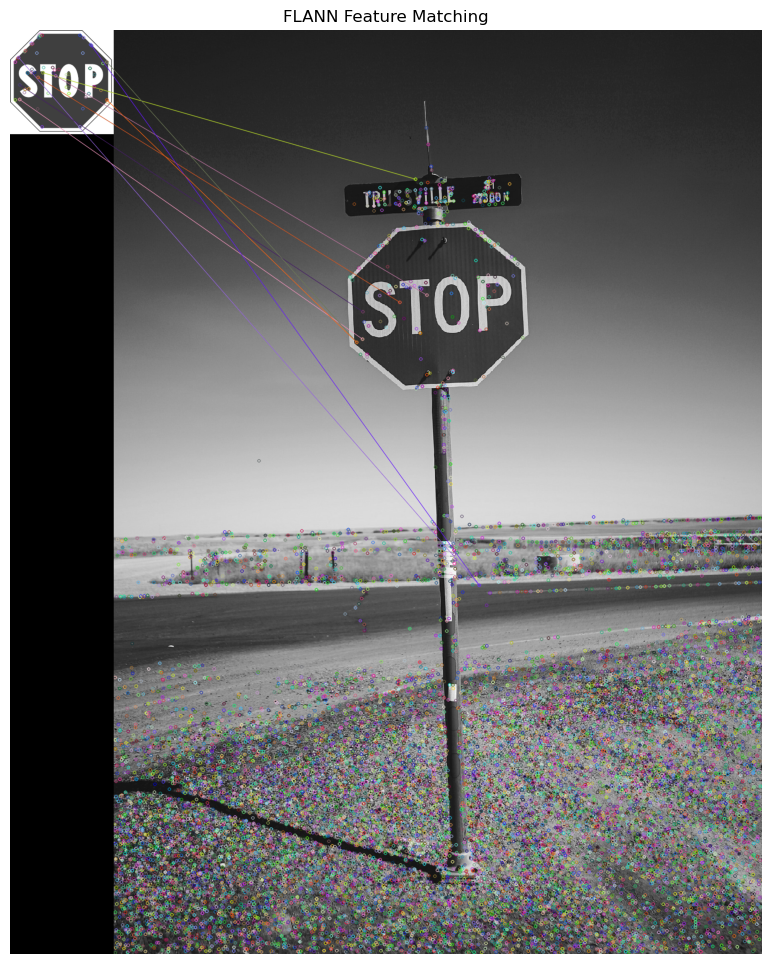

In [2]:
# FLANN matches

import cv2
import numpy as np
import time  # Import time module

# Load images
img1 = cv2.imread('source-sign.jpg', 0)  # Query Image
img2 = cv2.imread('target-sign.jpg', 0)  # Train Image

# Feature detector (SIFT)
sift = cv2.SIFT_create()

# Detect and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# FLANN Parameters
index_params = dict(algorithm=1, trees=5)  # KD-Tree index
search_params = dict(checks=50)  # Number of search iterations

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Start timing
start_time = time.time()

# Perform FLANN-based matching
matches = flann.knnMatch(des1, des2, k=2)

# End timing
end_time = time.time()

# Compute time taken
flann_time = end_time - start_time
print(f"FLANN-based matching took {flann_time:.6f} seconds")

# Apply Lowe’s Ratio Test to filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Draw matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None)

# Display the matches
# Display using Matplotlib (for Jupyter Notebook)
plt.figure(figsize=(24, 12))
plt.imshow(img_matches, cmap='viridis')
plt.title("FLANN Feature Matching")
plt.axis("off")  # Hide axis
plt.show()

Why did brute force run faster than FLANN? Because we only needed to find one object in a simple image. Let's try something more complicated.

Brute-Force matching took 0.017344 seconds


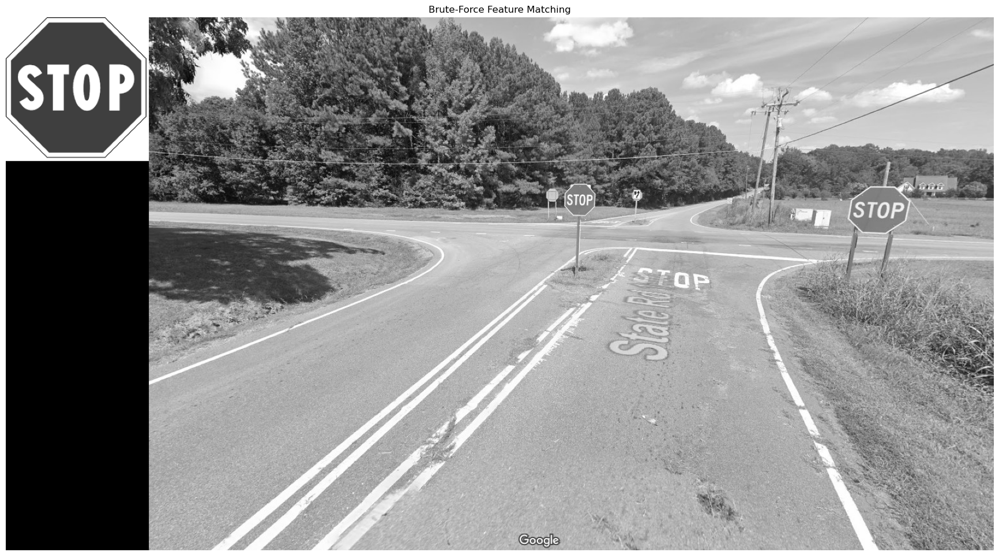

In [3]:
# Brute force matches for a more complicated scene

import cv2
import numpy as np
import time
import matplotlib.pyplot as plt  # Import Matplotlib for Jupyter Notebook display

# Load images
img1 = cv2.imread('source-sign.jpg', cv2.IMREAD_GRAYSCALE)  # Query Image
img2 = cv2.imread('target-sign-noisy.jpg', cv2.IMREAD_GRAYSCALE)  # Train Image

# Feature detector (SIFT)
sift = cv2.SIFT_create()

# Detect and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Brute-Force Matcher (BFMatcher)
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

# Start timing
start_time = time.time()

# Perform Brute-Force matching
matches = bf.knnMatch(des1, des2, k=2)

# End timing
end_time = time.time()

# Compute time taken
bf_time = end_time - start_time
print(f"Brute-Force matching took {bf_time:.6f} seconds")

# Apply Lowe’s Ratio Test to filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Draw matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display using Matplotlib (for Jupyter Notebook)
plt.figure(figsize=(24, 12))
plt.imshow(img_matches, cmap='viridis')
plt.title("Brute-Force Feature Matching")
plt.axis("off")  # Hide axis
plt.show()

FLANN-based matching took 0.138851 seconds


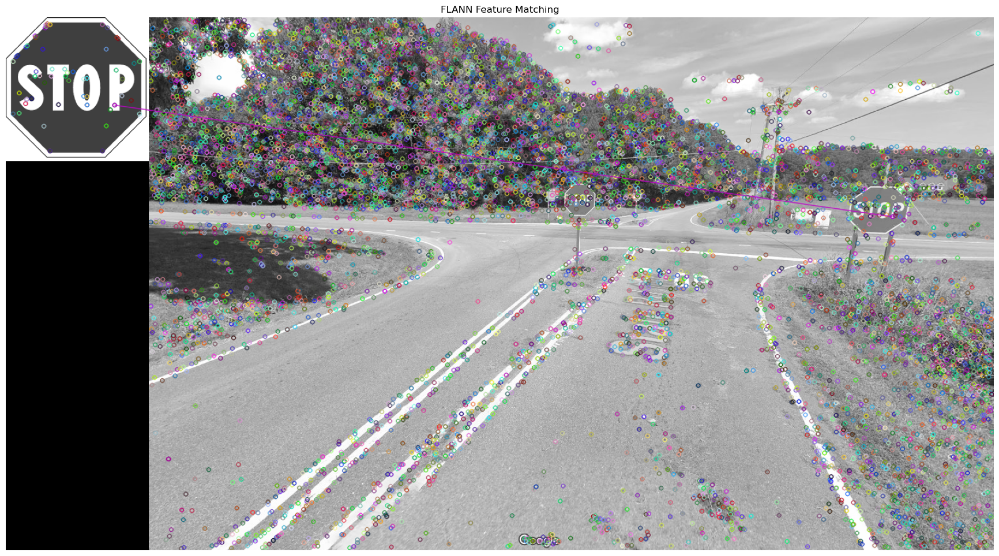

In [4]:
# FLANN matches

import cv2
import numpy as np
import time  # Import time module

# Load images
img1 = cv2.imread('source-sign.jpg', 0)  # Query Image
img2 = cv2.imread('target-sign-noisy.jpg', 0)  # Train Image

# Feature detector (SIFT)
sift = cv2.SIFT_create()

# Detect and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# FLANN Parameters
index_params = dict(algorithm=1, trees=5)  # KD-Tree index
search_params = dict(checks=50)  # Number of search iterations

flann = cv2.FlannBasedMatcher(index_params, search_params)

# Start timing
start_time = time.time()

# Perform FLANN-based matching
matches = flann.knnMatch(des1, des2, k=2)

# End timing
end_time = time.time()

# Compute time taken
flann_time = end_time - start_time
print(f"FLANN-based matching took {flann_time:.6f} seconds")

# Apply Lowe’s Ratio Test to filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Draw matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None)

# Display the matches
# Display using Matplotlib (for Jupyter Notebook)
plt.figure(figsize=(24, 12))
plt.imshow(img_matches, cmap='viridis')
plt.title("FLANN Feature Matching")
plt.axis("off")  # Hide axis
plt.show()

So, none of that worked particularly well. Let's break down the pieces of FLANN and see if we can do better.

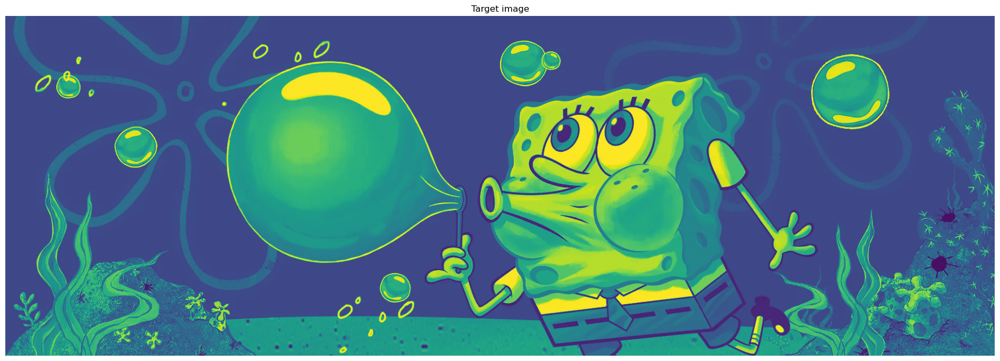

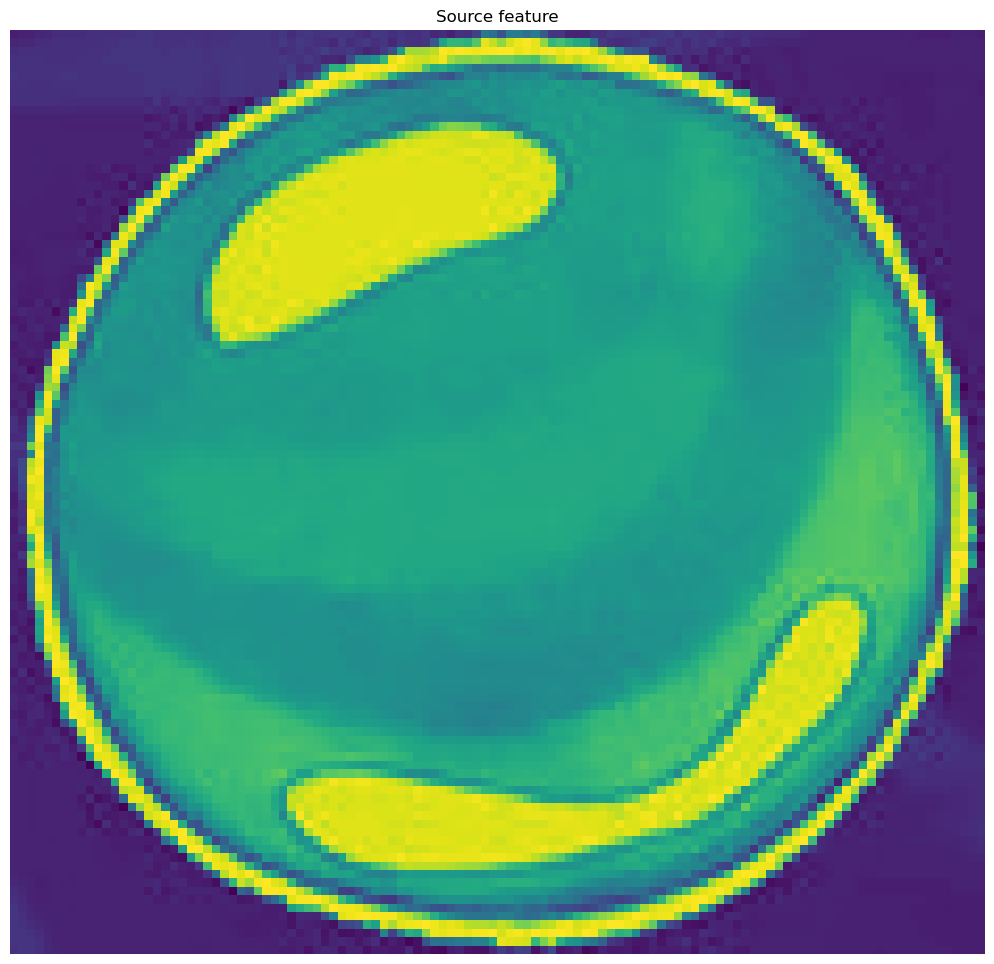

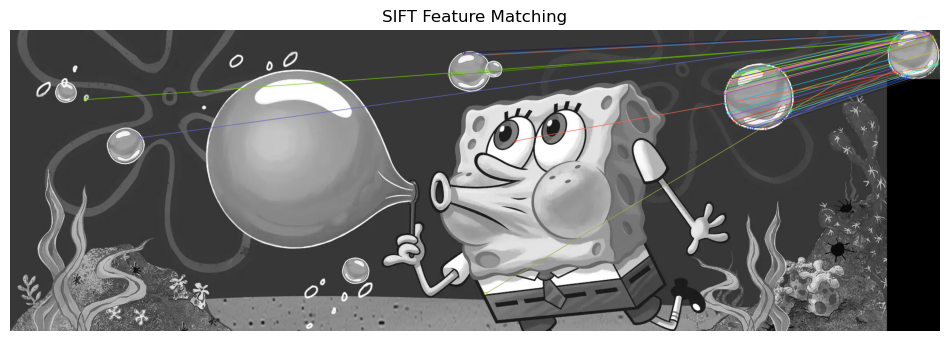

In [5]:
# load in a source image and a target image
import cv2
import numpy as np
import matplotlib.pyplot as plt  # Import Matplotlib for Jupyter Notebook display

# Load images
img1 = cv2.imread('spongebob-target.jpg', cv2.IMREAD_GRAYSCALE)  # Query Image
img2 = cv2.imread('bubble-source.jpg', cv2.IMREAD_GRAYSCALE)  # Train Image

plt.figure(figsize=(24, 12))
plt.imshow(img1)
plt.title("Target image")
plt.axis("off")  # Hide axis
plt.show()

plt.figure(figsize=(24, 12))
plt.imshow(img2)
plt.title("Source feature")
plt.axis("off")  # Hide axis
plt.show()

# Let's use SIFT detector to find the keypoints
# This time we will adjust our own parameters for tuning with smart choices. The parameters are:
# sift = cv2.SIFT_create(
#    nfeatures=500, # the size of our feature vector, higher value = more keypoints returned
#    contrastThreshold=0.03, # the acceptable difference (color, intensity, etc.) between a feature and its background, a lower value = more keypoints
#    edgeThreshold=15, # the minimum number of pixels required to form an edge
#    sigma=1.2 # the amount of Gaussian blurring done before edge and feature detection
#)

sift = cv2.SIFT_create(
    nfeatures=500, # We can leave this low, since we can guess that there are only about 10 bubbles in the target image
    contrastThreshold=0.1, # We can raise this, since the bubbles stand out from the background already
    edgeThreshold=15, # We aren't dealing with many background features, so we don't have to mess with this
    sigma=1.0 # We can lower the blur to help reduce false detections, again because the bubbles stand our clearly
)

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Brute-Force matcher with L2 norm distance
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)

# Sort matches by distance (best matches first)
matches = sorted(matches, key=lambda x: x.distance)

# Draw the top N matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], None, flags=2)

# Display using matplotlib
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.title('SIFT Feature Matching')
plt.axis('off')
plt.show()

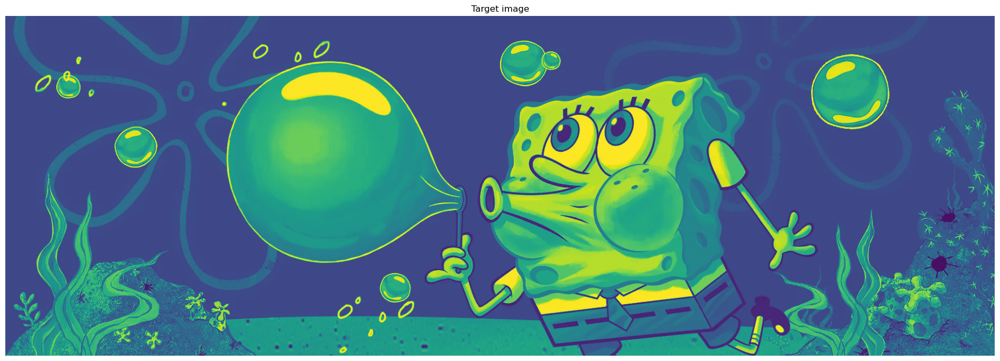

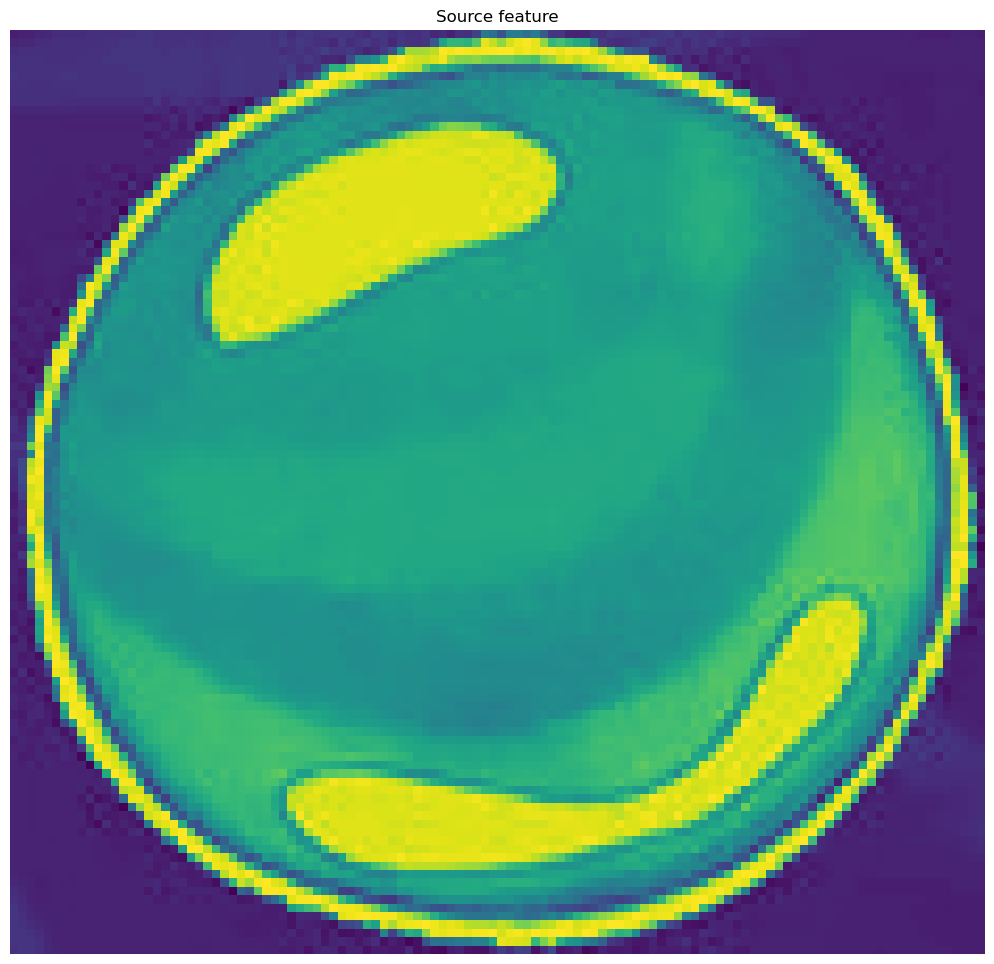

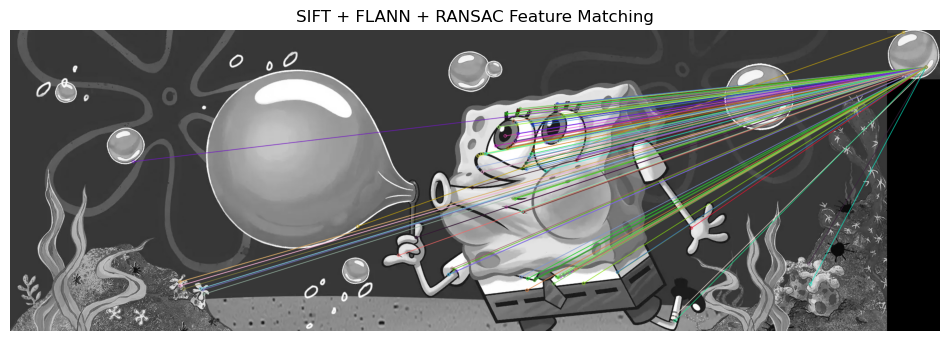

In [6]:
# We've gotten pretty accurage feature detection, though we've clearly missed a few bubbles.
# Now that we have our keypoints, we can apply FLANN

# load in a source image and a target image
import cv2
import numpy as np
import matplotlib.pyplot as plt  # Import Matplotlib for Jupyter Notebook display

# Load images
img1 = cv2.imread('spongebob-target.jpg', cv2.IMREAD_GRAYSCALE)  # Query Image
img2 = cv2.imread('bubble-source.jpg', cv2.IMREAD_GRAYSCALE)  # Train Image

plt.figure(figsize=(24, 12))
plt.imshow(img1)
plt.title("Target image")
plt.axis("off")  # Hide axis
plt.show()

plt.figure(figsize=(24, 12))
plt.imshow(img2)
plt.title("Source feature")
plt.axis("off")  # Hide axis
plt.show()

# Let's use SIFT detector to find the keypoints
# This time we will adjust our own parameters for tuning with smart choices. The parameters are:
# sift = cv2.SIFT_create(
#    nfeatures=500, # the size of our feature vector, higher value = more keypoints returned
#    contrastThreshold=0.03, # the acceptable difference (color, intensity, etc.) between a feature and its background, a lower value = more keypoints
#    edgeThreshold=15, # the minimum number of pixels required to form an edge
#    sigma=1.2 # the amount of Gaussian blurring done before edge and feature detection
#)

sift = cv2.SIFT_create(
    nfeatures=500, # We can leave this low, since we can guess that there are only about 10 bubbles in the target image
    contrastThreshold=0.1, # We can raise this, since the bubbles stand out from the background already
    edgeThreshold=15, # We aren't dealing with many background features, so we don't have to mess with this
    sigma=1.0 # We can lower the blur to help reduce false detections, again because the bubbles stand our clearly
)

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Step 2: FLANN-based matching
index_params = dict(algorithm=1, trees=10)  # KDTree with 10 trees
search_params = dict(checks=50)  # Number of checks to perform during the search

# Create the FLANN matcher
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Step 3: Match descriptors using FLANN
matches = flann.knnMatch(des1, des2, k=2)  # k=2 to apply Lowe's ratio test (this part can be removed)

# Step 4: Collect all good matches (no ratio test)
good_matches = []
pts1 = []
pts2 = []

for m in matches:
    good_matches.append(m[0])  # Add the best match (m[0]) to good_matches
    pts1.append(kp1[m[0].queryIdx].pt)
    pts2.append(kp2[m[0].trainIdx].pt)

# Convert the points to numpy arrays
pts1 = np.float32(pts1).reshape(-1, 1, 2)
pts2 = np.float32(pts2).reshape(-1, 1, 2)

# Step 5: Compute the homography using RANSAC
H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, 5.0)

# Step 6: Use the mask to get the inlier matches
inliers = [good_matches[i] for i in range(len(good_matches)) if mask[i] == 1]

# Step 7: Draw the inlier matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, inliers, None, flags=2)

# Step 8: Show the matches
plt.figure(figsize=(12, 6))
plt.imshow(img_matches)
plt.title('SIFT + FLANN + RANSAC Feature Matching')
plt.axis('off')
plt.show()

What on earth just happened? FLANN turned our excellent SIFT matches into terrible garbage. This is because SIFT and FLANN are finding a ton of keypoints in the white region of the bubble and then matching anything white, e.g., Spongebob's shirt. Let's change some parameters and see if we can do better.

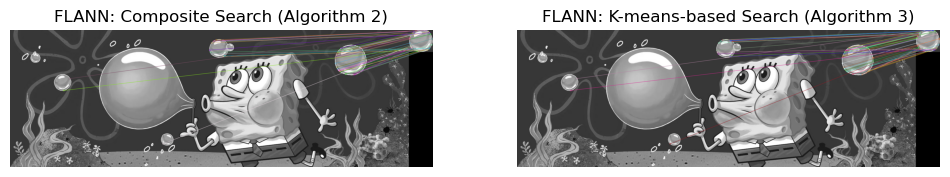

In [7]:
# Try different FLANN / RANSAC algorithms
# Composite search (algorithm=2) or K-means-based search (algorithm=3)
index_params_2 = dict(algorithm=2, trees=5)  # Composite search
index_params_3 = dict(algorithm=3, branching=32, iterations=11, checks=64)  # K-means-based search

# Using Composite search
flann_matcher_2 = cv2.FlannBasedMatcher(index_params_2, {})  
matches_2 = flann_matcher_2.match(des1, des2)

# Using K-means-based search
flann_matcher_3 = cv2.FlannBasedMatcher(index_params_3, {})  
matches_3 = flann_matcher_3.match(des1, des2)

# Sort matches based on distance (lower distance is better)
matches_2 = sorted(matches_2, key=lambda x: x.distance)
matches_3 = sorted(matches_3, key=lambda x: x.distance)

# Draw the matches for both algorithms (Composite Search and K-means-based Search)
img_matches_2 = cv2.drawMatches(img1, kp1, img2, kp2, matches_2[:50], None, flags=2)
img_matches_3 = cv2.drawMatches(img1, kp1, img2, kp2, matches_3[:50], None, flags=2)

# Display the results using matplotlib
plt.figure(figsize=(12, 6))

# Displaying the results for Composite search (algorithm=2)
plt.subplot(1, 2, 1)
plt.imshow(img_matches_2)
plt.title('FLANN: Composite Search (Algorithm 2)')
plt.axis('off')

# Displaying the results for K-means-based search (algorithm=3)
plt.subplot(1, 2, 2)
plt.imshow(img_matches_3)
plt.title('FLANN: K-means-based Search (Algorithm 3)')
plt.axis('off')

plt.show()

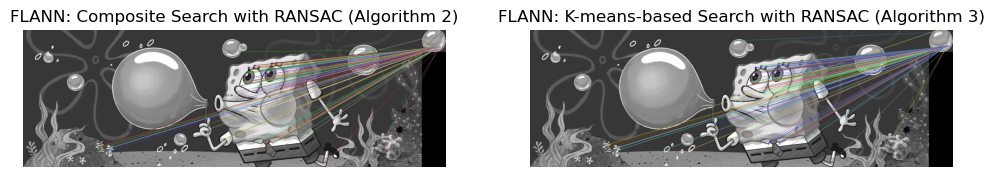

In [8]:
# Add in RANSAC
# Step 4: Apply RANSAC to filter out outlier matches
# Extract the matched keypoints from both images
pts1 = np.float32([kp1[m.queryIdx].pt for m in matches_2]).reshape(-1, 1, 2)
pts2 = np.float32([kp2[m.trainIdx].pt for m in matches_2]).reshape(-1, 1, 2)

# Find the homography using RANSAC
# RANSAC will return the inlier matches and the homography matrix
H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, 5.0)

# Step 5: Filter out the inliers using the mask
inliers_2 = [m for i, m in enumerate(matches_2) if mask[i] == 1]

# Draw the inlier matches for Composite search (algorithm=2)
img_matches_2 = cv2.drawMatches(img1, kp1, img2, kp2, inliers_2, None, flags=2)

# Repeat the same process for K-means-based search (algorithm=3)
pts1_3 = np.float32([kp1[m.queryIdx].pt for m in matches_3]).reshape(-1, 1, 2)
pts2_3 = np.float32([kp2[m.trainIdx].pt for m in matches_3]).reshape(-1, 1, 2)

# Find the homography using RANSAC for K-means-based matches
H_3, mask_3 = cv2.findHomography(pts1_3, pts2_3, cv2.RANSAC, 5.0)

# Filter out the inliers
inliers_3 = [m for i, m in enumerate(matches_3) if mask_3[i] == 1]

# Draw the inlier matches for K-means-based search (algorithm=3)
img_matches_3 = cv2.drawMatches(img1, kp1, img2, kp2, inliers_3, None, flags=2)

# Step 6: Display the results using matplotlib
plt.figure(figsize=(12, 6))

# Displaying the results for Composite search (algorithm=2)
plt.subplot(1, 2, 1)
plt.imshow(img_matches_2)
plt.title('FLANN: Composite Search with RANSAC (Algorithm 2)')
plt.axis('off')

# Displaying the results for K-means-based search (algorithm=3)
plt.subplot(1, 2, 2)
plt.imshow(img_matches_3)
plt.title('FLANN: K-means-based Search with RANSAC (Algorithm 3)')
plt.axis('off')

plt.show()

So in this example, RANSAC ends up doing more harm that good --> the types of feature detection and matching we use are highly dependent on application and context. Finally, let's put the keypoints into the original image

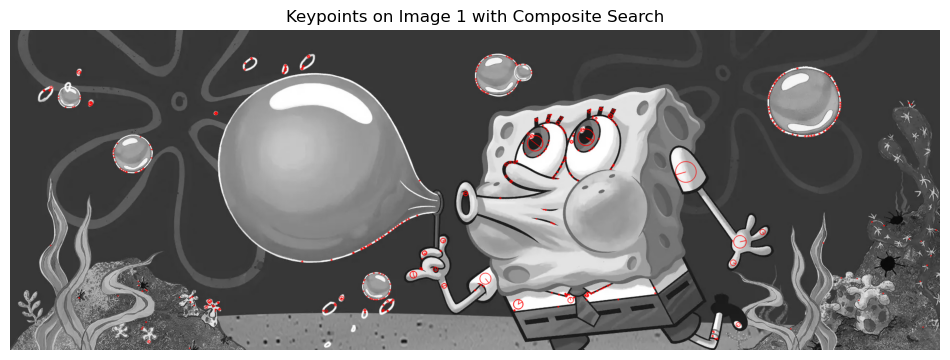

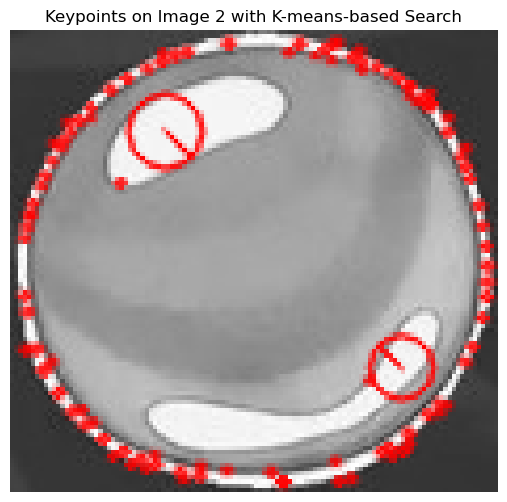

In [9]:
# Composite search (algorithm=2) or K-means-based search (algorithm=3)
index_params_2 = dict(algorithm=2, trees=5)  # Composite search
index_params_3 = dict(algorithm=3, branching=32, iterations=11, checks=64)  # K-means-based search

# Using Composite search
flann_matcher_2 = cv2.FlannBasedMatcher(index_params_2, {})  
matches_2 = flann_matcher_2.match(des1, des2)

# Using K-means-based search
flann_matcher_3 = cv2.FlannBasedMatcher(index_params_3, {})  
matches_3 = flann_matcher_3.match(des1, des2)

# Sort matches based on distance (lower distance is better)
matches_2 = sorted(matches_2, key=lambda x: x.distance)
matches_3 = sorted(matches_3, key=lambda x: x.distance)

# Draw the keypoints on the images (with red 'X')
img1_with_kp = cv2.drawKeypoints(img1, kp1, None, color=(255, 0, 0), flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
img2_with_kp = cv2.drawKeypoints(img2, kp2, None, color=(255, 0, 0), flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Step 3: Display the results using matplotlib (Separate Plots)
# Display Image 1 with keypoints (Larger Image)
plt.figure(figsize=(12, 8))  # Larger figure for image 1
plt.imshow(img1_with_kp)
plt.title('Keypoints on Image 1 with Composite Search')
plt.axis('off')
plt.show()

# Display Image 2 with keypoints
plt.figure(figsize=(8, 6))  # Smaller figure for image 2
plt.imshow(img2_with_kp)
plt.title('Keypoints on Image 2 with K-means-based Search')
plt.axis('off')
plt.show()